In [ ]:
#make sure to setup kernel associated with Capstone (the conda env), 
#and change kernel to it (Kernel > change kernel), restart notebook if you need to change kernel 

In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt

from dataset import YouCookII
from dataset import collate_fn
from torch.utils.data import DataLoader
from loss import loss_RA_MIL
from transformers import get_linear_schedule_with_warmup
from model import Model


def train(model, num_actions, batch_size, epochs=25, lr=0.001, y=0.5):
    dataset = YouCookII(num_actions, "/h/sagar/ece496-capstone/datasets/ycii")
    train_size = int(len(dataset) * (2/3))
    valid_size = int(len(dataset) - train_size)
    
    train_dataset, valid_dataset = torch.utils.data.random_split(dataset, [train_size, valid_size])
    
    train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_fn)
    valid_dataloader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_fn)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    scheduler = get_linear_schedule_with_warmup(optimizer, int(0.2*epochs), epochs)

    train_loss = np.zeros(epochs)
    valid_loss = np.zeros(epochs)
    
    model.train()
    
    for epoch in range(epochs):
        epoch_loss = 0.0
        num_batches = 0
        for data in train_dataloader:
            _, bboxes_tensor, features_tensor, steps_list, entity_list, entity_count_list, _, _ = data
            batch_size = len(data[0])
            
            # Zero out any gradients.
            optimizer.zero_grad()

            # Run inference (forward pass).            
            loss_E, loss_V, loss_R, _, _, _, _, _ = model(batch_size, num_actions + 1, steps_list, features_tensor, bboxes_tensor, entity_count_list, entity_list)

            # Loss from alignment.
            loss_ = loss_RA_MIL(y, loss_R, loss_E, loss_V)

            # Backpropagation (backward pass).
            loss_.backward()

            # Update parameters.
            optimizer.step()
            
            epoch_loss += loss_
            num_batches += 1
        
        #learning rate schedule
        #update after each epoch
        scheduler.step()
        epoch_loss = epoch_loss / num_batches
        
        # Save loss and accuracy at each epoch, plot (and checkpoint).
        train_loss[epoch] = epoch_loss
        valid_loss[epoch] = get_validation_loss(num_actions, y, valid_dataloader)
        
        #after epoch completes
        print("Epoch {} - Train Loss: {}, Validation Loss: {}".format(epoch + 1, train_loss[epoch], valid_loss[epoch]))
    
    plt.plot(train_loss, label='train loss')
    plt.plot(valid_loss, label='valid loss')
    plt.legend()
    plt.show()
        
    return train_loss, valid_loss

def get_validation_loss(num_actions, y, valid_dataloader):
    epoch_loss = 0.0
    num_batches = 0
        
    with torch.no_grad():
        for data in valid_dataloader:
            _, bboxes_tensor, features_tensor, steps_list, entity_list, entity_count_list, _, _ = data
            batch_size = len(data[0])

            # Run inference (forward pass).
            loss_E, loss_V, loss_R, _, _, _, _, _ = model(batch_size, num_actions + 1, steps_list, features_tensor, bboxes_tensor, entity_count_list, entity_list)

            # Loss from alignment.
            loss_ = loss_RA_MIL(y, loss_R, loss_E, loss_V)
            
            epoch_loss += loss_
            num_batches += 1
            
    epoch_loss = epoch_loss / num_batches
    
    return epoch_loss

PyTorch version 1.6.0 available.


In [4]:
import importlib
import visualizer
importlib.reload(visualizer)

import model
importlib.reload(model)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = model.Model(device)
#model.load_state_dict(torch.load("/h/sagar/ece496-capstone/weights/weights"))


Epoch 1 - Train Loss: 2267.374755859375, Validation Loss: 2041.0504150390625
Epoch 2 - Train Loss: 1368.409912109375, Validation Loss: 1246.165283203125
Epoch 3 - Train Loss: 1233.7738037109375, Validation Loss: 948.17578125
Epoch 4 - Train Loss: 1076.9266357421875, Validation Loss: 1090.9891357421875
Epoch 5 - Train Loss: 911.2211303710938, Validation Loss: 1068.036376953125
Epoch 6 - Train Loss: 904.80078125, Validation Loss: 958.6517944335938
Epoch 7 - Train Loss: 834.3043212890625, Validation Loss: 845.4732666015625
Epoch 8 - Train Loss: 871.1942749023438, Validation Loss: 742.2261962890625
Epoch 9 - Train Loss: 916.12841796875, Validation Loss: 756.149658203125
Epoch 10 - Train Loss: 901.7381591796875, Validation Loss: 1110.4981689453125
Epoch 11 - Train Loss: 739.1806640625, Validation Loss: 832.8013916015625
Epoch 12 - Train Loss: 643.0333251953125, Validation Loss: 922.3466796875
Epoch 13 - Train Loss: 684.1748046875, Validation Loss: 693.7425537109375
Epoch 14 - Train Loss: 65

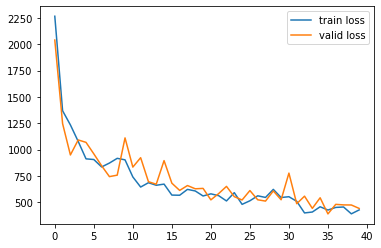

In [5]:

train_loss, valid_loss = train(model, 8, 2, epochs=40, lr=1e-5, y=1.0)

In [8]:
import importlib
import visualizer
importlib.reload(visualizer)



<module 'visualizer' from '/scratch/ssd002/home/mhasan/ece496-capstone/train/visualizer.py'>

Action 1: add carrots onions bell peppers and cabbage to the pot and stir
-------------------------------
carrots onions bell peppers -> Action 8 ([NULL])
the pot -> Action 8 ([NULL])


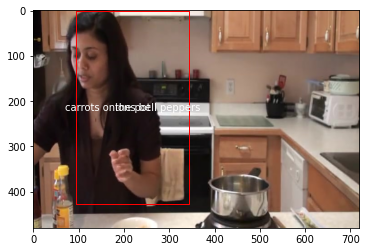

Action 2: add a pinch of salt and vinegar and stir
-------------------------------
a pinch -> Action 0 (add carrots onions bell peppers and cabbage to the pot and stir)
salt -> Action 8 ([NULL])


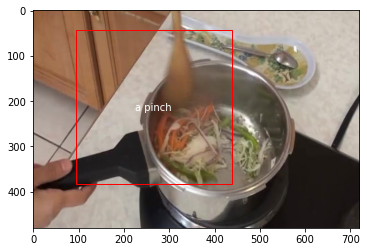

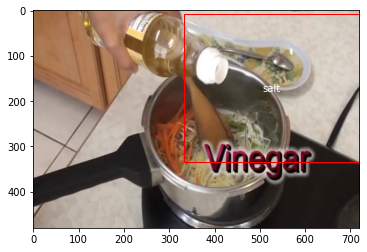

Action 3: add noodles and vegetable broth and stir
-------------------------------
noodles -> Action 8 ([NULL])


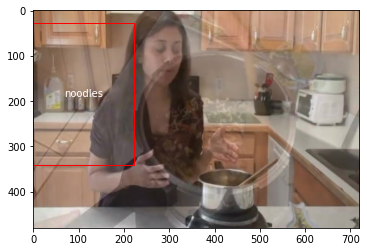

Action 4: add minced garlic and ginger soy sauce hot sauce sweet and sour sauce and stir
-------------------------------
minced garlic -> Action 2 (add noodles and vegetable broth and stir)
hot sauce -> Action 8 ([NULL])
sweet and sour sauce -> Action 1 (add a pinch of salt and vinegar and stir)


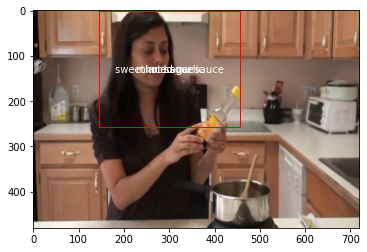

Action 5: add sesame seed oil and cover
-------------------------------
sesame seed oil -> Action 3 (add minced garlic and ginger soy sauce hot sauce sweet and sour sauce and stir)


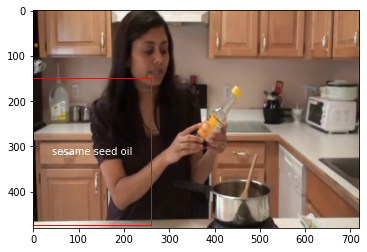

Action 6: when the soup boils add arrow root powdera and stir
-------------------------------
arrow root powdera -> Action 3 (add minced garlic and ginger soy sauce hot sauce sweet and sour sauce and stir)


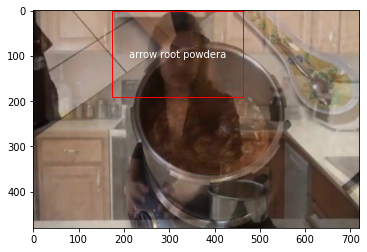

Action 7: add tofu to the soup
-------------------------------
tofu -> Action 3 (add minced garlic and ginger soy sauce hot sauce sweet and sour sauce and stir)
the soup -> Action 3 (add minced garlic and ginger soy sauce hot sauce sweet and sour sauce and stir)


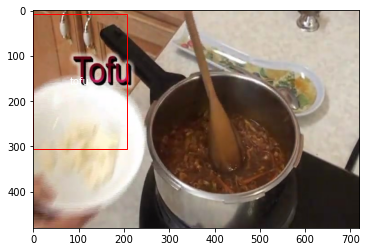

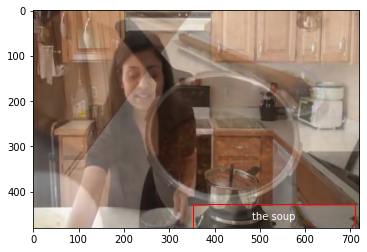

Action 8: ladle soup into the bowl and top with green onion
-------------------------------
the bowl -> Action 1 (add a pinch of salt and vinegar and stir)
green onion -> Action 3 (add minced garlic and ginger soy sauce hot sauce sweet and sour sauce and stir)


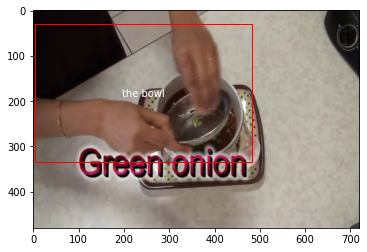

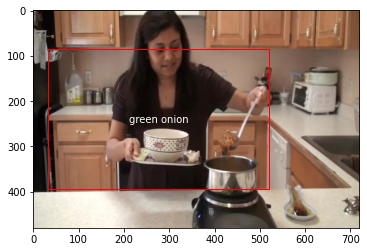

In [8]:
VG, RR = visualizer.inference(model, 8, 2)

[['the wing', 'the two joints'], ['a bowl'], ['the wings', 'the seasoning mix'], ['the wings', 'the oven'], ['the wings'], ['the wings', 'the oven'], ['hot sauce'], ['the wings', 'sauce'], ['[unused1]']]
Action 1: cut the wing at the two joints
-------------------------------
the wing -> Action 8 ([NULL])
the two joints -> Action 8 ([NULL])


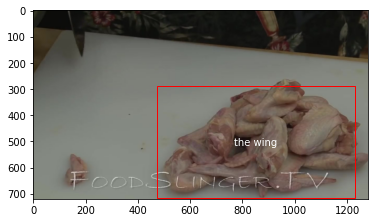

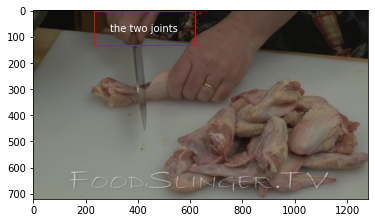

Action 2: mix salt seasoning pepper and baking powder in a bowl
-------------------------------
a bowl -> Action 0 (cut the wing at the two joints)


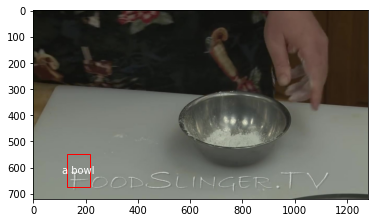

Action 3: coat the wings in the seasoning mix
-------------------------------
the wings -> Action 8 ([NULL])
the seasoning mix -> Action 1 (mix salt seasoning pepper and baking powder in a bowl)


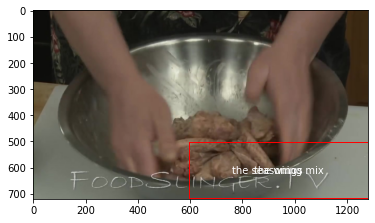

Action 4: cook the wings in the oven
-------------------------------
the wings -> Action 8 ([NULL])
the oven -> Action 0 (cut the wing at the two joints)


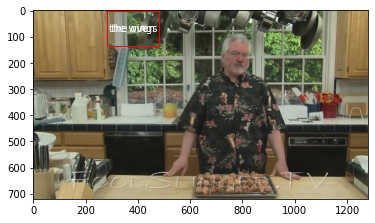

Action 5: flip the wings
-------------------------------
the wings -> Action 3 (cook the wings in the oven)


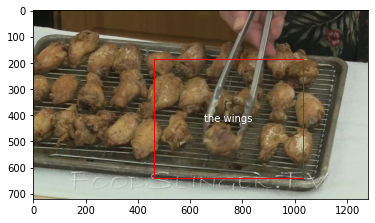

Action 6: cook the wings in the oven
-------------------------------
the wings -> Action 3 (cook the wings in the oven)
the oven -> Action 0 (cut the wing at the two joints)


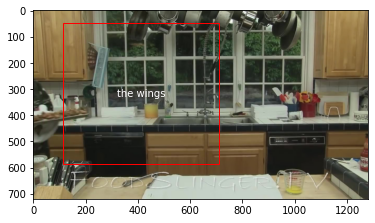

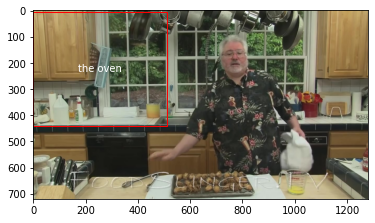

Action 7: mix hot sauce and melted butter together
-------------------------------
hot sauce -> Action 0 (cut the wing at the two joints)


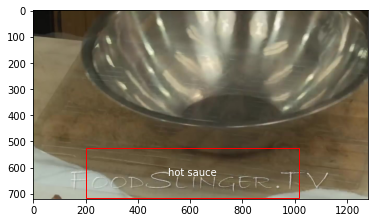

Action 8: coat the wings in sauce
-------------------------------
the wings -> Action 3 (cook the wings in the oven)
sauce -> Action 3 (cook the wings in the oven)


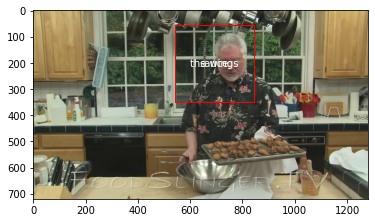

In [9]:
VG, RR = visualizer.inference(model, 8, 40)

In [6]:
import importlib
import visualizer
importlib.reload(visualizer)

import model
importlib.reload(model)



Action 1: cut the wing at the two joints
-------------------------------
the wing -> Action 8 ([NULL])
the two joints -> Action 8 ([NULL])


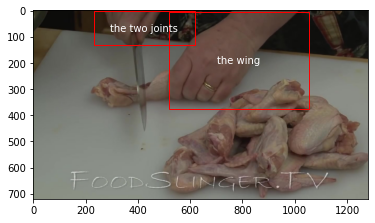

Action 2: mix salt seasoning pepper and baking powder in a bowl
-------------------------------
a bowl -> Action 8 ([NULL])


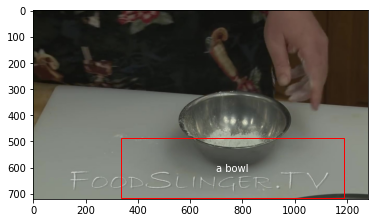

Action 3: coat the wings in the seasoning mix
-------------------------------
the wings -> Action 8 ([NULL])
the seasoning mix -> Action 8 ([NULL])


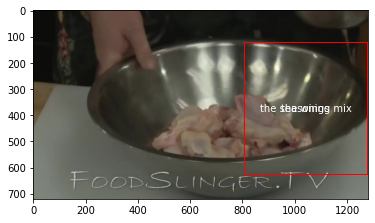

Action 4: cook the wings in the oven
-------------------------------
the wings -> Action 2 (coat the wings in the seasoning mix)
the oven -> Action 8 ([NULL])


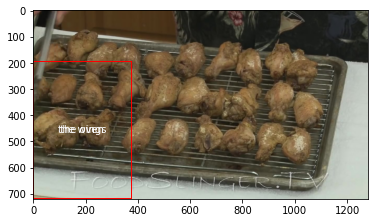

Action 5: flip the wings
-------------------------------
the wings -> Action 3 (cook the wings in the oven)


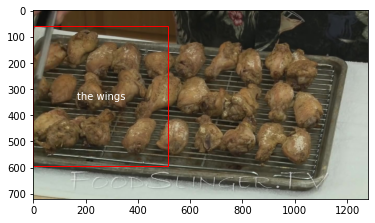

Action 6: cook the wings in the oven
-------------------------------
the wings -> Action 4 (flip the wings)
the oven -> Action 4 (flip the wings)


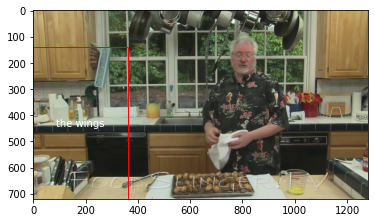

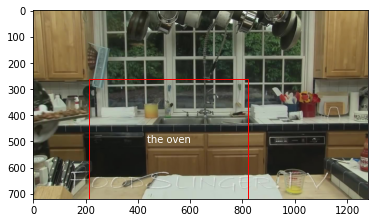

Action 7: mix hot sauce and melted butter together
-------------------------------
hot sauce -> Action 4 (flip the wings)


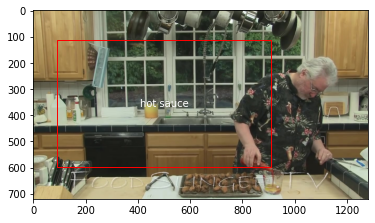

Action 8: coat the wings in sauce
-------------------------------
the wings -> Action 5 (cook the wings in the oven)
sauce -> Action 5 (cook the wings in the oven)


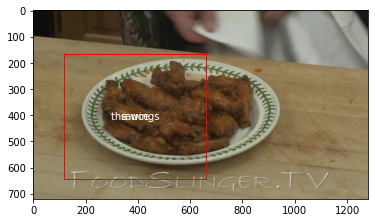

In [7]:
#from visualizer import inference
#POST_TRAINING more
VG, RR = visualizer.inference(model, 8, 40)

Action 1: cut the wing at the two joints
-------------------------------
the wing -> Action 8 ([NULL])
the two joints -> Action 8 ([NULL])


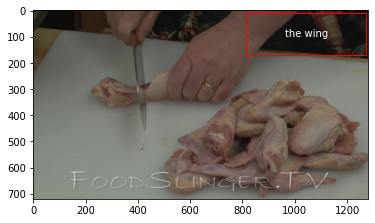

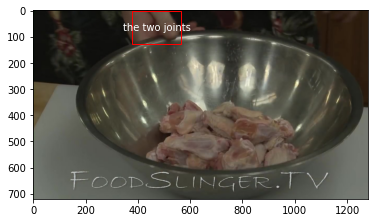

Action 2: mix salt seasoning pepper and baking powder in a bowl
-------------------------------
a bowl -> Action 8 ([NULL])


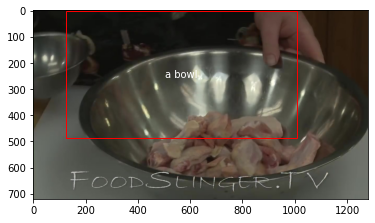

Action 3: coat the wings in the seasoning mix
-------------------------------
the wings -> Action 1 (mix salt seasoning pepper and baking powder in a bowl)
the seasoning mix -> Action 8 ([NULL])


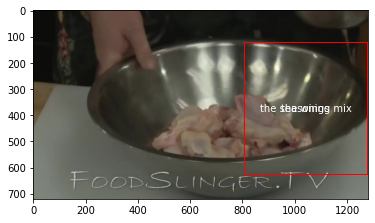

Action 4: cook the wings in the oven
-------------------------------
the wings -> Action 8 ([NULL])
the oven -> Action 8 ([NULL])


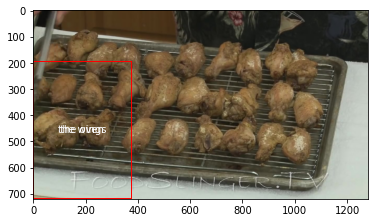

Action 5: flip the wings
-------------------------------
the wings -> Action 3 (cook the wings in the oven)


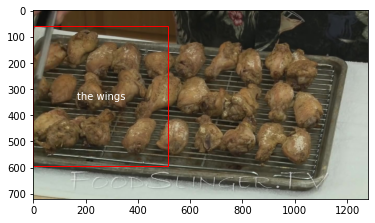

Action 6: cook the wings in the oven
-------------------------------
the wings -> Action 3 (cook the wings in the oven)
the oven -> Action 4 (flip the wings)


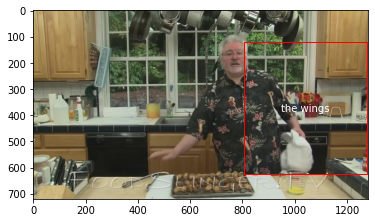

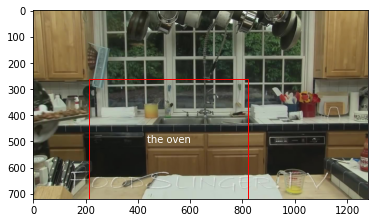

Action 7: mix hot sauce and melted butter together
-------------------------------
hot sauce -> Action 4 (flip the wings)


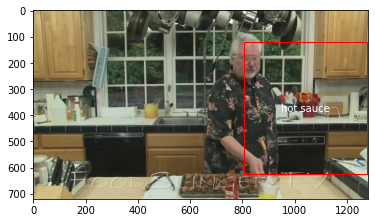

Action 8: coat the wings in sauce
-------------------------------
the wings -> Action 5 (cook the wings in the oven)
sauce -> Action 5 (cook the wings in the oven)


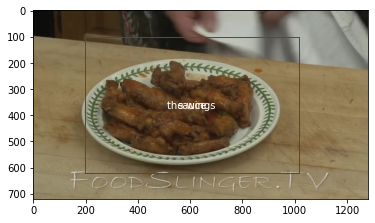

In [5]:
#from visualizer import inference
#POST_TRAINING more
VG, RR = visualizer.inference(model, 8, 40)

Action 1: cut the wing at the two joints
-------------------------------
the wing -> Action 8 ([NULL])
the two joints -> Action 8 ([NULL])


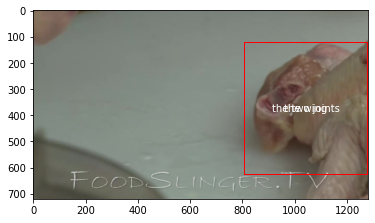

Action 2: mix salt seasoning pepper and baking powder in a bowl
-------------------------------
a bowl -> Action 8 ([NULL])


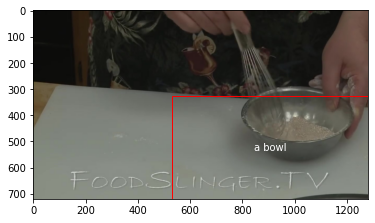

Action 3: coat the wings in the seasoning mix
-------------------------------
the wings -> Action 8 ([NULL])
the seasoning mix -> Action 8 ([NULL])


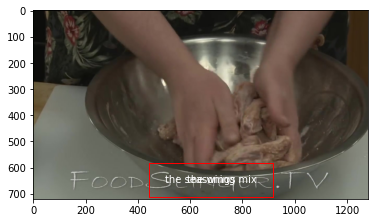

Action 4: cook the wings in the oven
-------------------------------
the wings -> Action 8 ([NULL])
the oven -> Action 8 ([NULL])


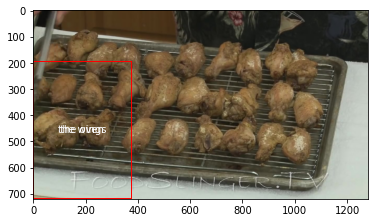

Action 5: flip the wings
-------------------------------
the wings -> Action 8 ([NULL])


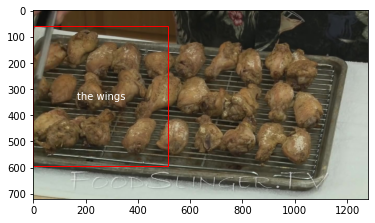

Action 6: cook the wings in the oven
-------------------------------
the wings -> Action 3 (cook the wings in the oven)
the oven -> Action 8 ([NULL])


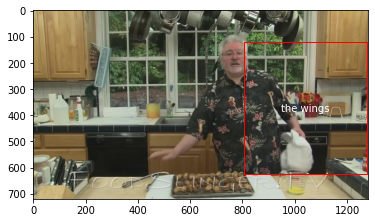

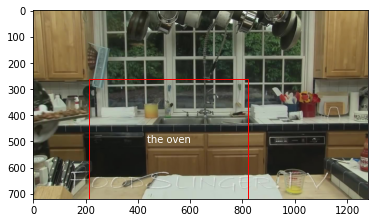

Action 7: mix hot sauce and melted butter together
-------------------------------
hot sauce -> Action 8 ([NULL])


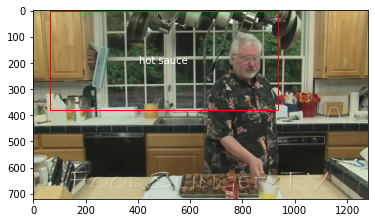

Action 8: coat the wings in sauce
-------------------------------
the wings -> Action 6 (mix hot sauce and melted butter together)
sauce -> Action 8 ([NULL])


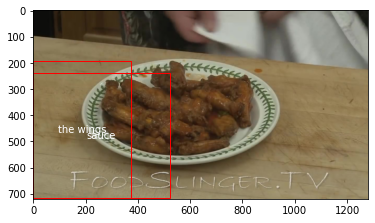

In [4]:
#from visualizer import inference
#POST_TRAINING
VG, RR = visualizer.inference(model, 8, 40)

Action 1: cut the wing at the two joints
-------------------------------
the wing -> Action 8 ([NULL])
the two joints -> Action 8 ([NULL])


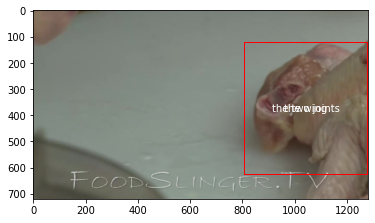

Action 2: mix salt seasoning pepper and baking powder in a bowl
-------------------------------
a bowl -> Action 8 ([NULL])


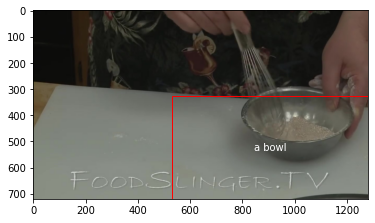

Action 3: coat the wings in the seasoning mix
-------------------------------
the wings -> Action 8 ([NULL])
the seasoning mix -> Action 8 ([NULL])


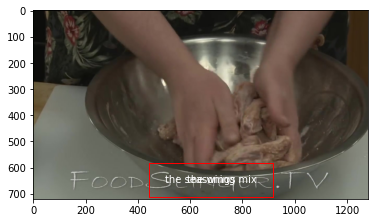

Action 4: cook the wings in the oven
-------------------------------
the wings -> Action 8 ([NULL])
the oven -> Action 8 ([NULL])


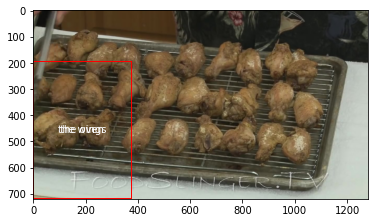

Action 5: flip the wings
-------------------------------
the wings -> Action 8 ([NULL])


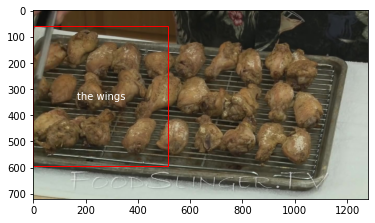

Action 6: cook the wings in the oven
-------------------------------
the wings -> Action 3 (cook the wings in the oven)
the oven -> Action 8 ([NULL])


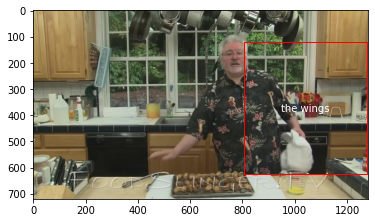

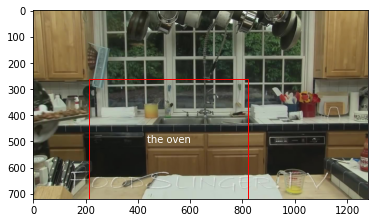

Action 7: mix hot sauce and melted butter together
-------------------------------
hot sauce -> Action 8 ([NULL])


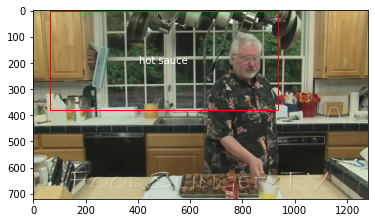

Action 8: coat the wings in sauce
-------------------------------
the wings -> Action 6 (mix hot sauce and melted butter together)
sauce -> Action 8 ([NULL])


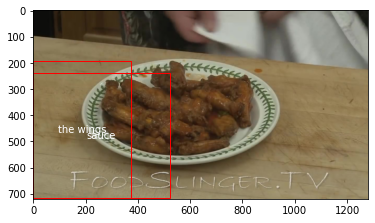

In [19]:
#from visualizer import inference
#PRE_TRAINING
VG, RR = visualizer.inference(model, 8, 40)

In [24]:
#post_training
VG

tensor([[21, 35],
        [41, 39],
        [64, 64],
        [87, 87],
        [ 7,  7],
        [16, 42],
        [57, 57],
        [75, 88],
        [99, 99]], device='cuda:0')

In [12]:
#pre_training
VG

tensor([[92, 92],
        [33, 33],
        [12, 12],
        [54, 54],
        [98, 98],
        [18, 18],
        [55, 55],
        [38, 38],
        [54, 54]], device='cuda:0')

In [20]:
VG

tensor([[16, 16],
        [91, 91],
        [56, 56],
        [81, 81],
        [ 1,  1],
        [16, 42],
        [ 6, 79],
        [81, 80],
        [99, 99]], device='cuda:0')

In [9]:
VG

tensor([[65, 65],
        [93, 50],
        [34, 34],
        [82, 82],
        [15, 37]], device='cuda:0')

In [12]:
torch.save(model.state_dict(), "/h/sagar/ece496-capstone/weights/weights")

In [130]:
######
#WITH ENTITY AVERAGE EMBEDDING

In [133]:
import model
importlib.reload(model)


model2 = model.Model(device)

In [134]:

train_loss, valid_loss = train(model2, 8, 2, epochs=8, lr=1e-5, y=1.0)

RuntimeError: CUDA out of memory. Tried to allocate 60.00 MiB (GPU 0; 14.76 GiB total capacity; 13.58 GiB already allocated; 53.75 MiB free; 13.82 GiB reserved in total by PyTorch)

## Experiments + Visualization

We will load a single datapoint and try to examine all values flowing through the computation

In [6]:
#setup dataset and model

num_actions = 8
batch_size = 1
lr = 1e-5
epochs = 1

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

#model = Model(device)

dataset = YouCookII(num_actions, "/h/sagar/ece496-capstone/datasets/ycii")
train_size = int(len(dataset) * (2/3))
valid_size = int(len(dataset) - train_size)

train_dataset, valid_dataset = torch.utils.data.random_split(dataset, [train_size, valid_size])

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_fn)
valid_dataloader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_fn)

optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = get_linear_schedule_with_warmup(optimizer, int(0.2*epochs), epochs)

train_loss = np.zeros(epochs)
valid_loss = np.zeros(epochs)



In [8]:
datapoint = next(iter(train_dataloader))

In [9]:
#this data point has `index= 16 (for visualizing)
datapoint

(['oYLrSflCI2g'],
 tensor([[[0.1371, 0.6915, 0.2833, 0.8249],
          [0.3466, 0.0651, 0.5326, 0.4118],
          [0.3750, 0.1109, 0.5265, 0.5347],
          ...,
          [0.2637, 0.0043, 0.8988, 0.7167],
          [0.3018, 0.4564, 0.7848, 1.0000],
          [0.2034, 0.0939, 0.6596, 0.8819]]]),
 tensor([[[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           1.6023e-01, 6.2477e-01],
          [0.0000e+00, 0.0000e+00, 3.2533e-02,  ..., 4.7551e-03,
           2.6778e+00, 4.5171e-01],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           3.3585e-01, 2.5809e-01],
          ...,
          [7.1951e-01, 4.6920e-02, 0.0000e+00,  ..., 7.9621e-03,
           3.2690e+00, 1.6802e-01],
          [1.1199e+00, 6.0814e-01, 0.0000e+00,  ..., 8.4182e-04,
           6.3293e-01, 1.2001e+00],
          [2.2220e-02, 5.2460e-01, 1.3924e-02,  ..., 0.0000e+00,
           9.8468e-01, 1.8162e+00]]]),
 ['add [unused2] flour oil and salt in [unused2] a bowl and mix. [unused3] p

In [10]:
vid_id, bboxes_tensor, features_tensor, steps_list, entity_list, entity_count_list, entity_indices, _ = datapoint

In [11]:
entity_list

[[['flour oil', 'a bowl'],
  ['water', 'the bowl'],
  ['the dough'],
  ['a piece', 'dough', 'a ball', 'flour'],
  ['the dough', 'a thin oval'],
  ['oil', 'the dough'],
  ['the dough', 'half'],
  ['the roti', 'a hot pan ad flip'],
  ['[unused1]']]]

In [12]:
steps_list

['add [unused2] flour oil and salt in [unused2] a bowl and mix. [unused3] pour [unused2] water into [unused2] the bowl while mixing. [unused3] knead [unused2] the dough until it is soft. [unused3] roll [unused2] a piece of [unused2] dough into [unused2] a ball and dip in [unused2] flour. [unused3] roll [unused2] the dough into [unused2] a thin oval. [unused3] add [unused2] oil and flour to [unused2] the dough. [unused3] fold [unused2] the dough in [unused2] half and roll again. [unused3] place [unused2] the roti to [unused2] a hot pan ad flip. [unused3] [unused1] [unused3]']

In [54]:
inputs = model.lxmert_tokenizer(
    steps_list,
    padding="longest",
    truncation=False,
    return_token_type_ids=True,
    return_attention_mask=True,
    add_special_tokens=True,
    return_tensors="pt"
)

#the actual text tokens used
text_tokens = model.lxmert_tokenizer.convert_ids_to_tokens(inputs.input_ids[0])

In [59]:
def contains(sub, pri):
    M, N = len(pri), len(sub)
    i, LAST = 0, M-N+1
    while True:
        try:
            found = pri.index(sub[0], i, LAST) # find first elem in sub
        except ValueError:
            return False
        if pri[found:found+N] == sub:
            return [found, found+N-1]
        else:
            i = found+1

In [66]:
inds_a,inds_b = contains([23,45,6],[1,23,45,6,7,8,100])

In [67]:
inds_b

3

In [65]:
l = [1,23,45,6,7,8,100]
for i in inds:
    print(l[i])

23
6


In [72]:
#set of actions
#must do for each batch

#first remove entities throughout
step_list_rm = " ".join([s for s in steps_list[0].split(' ') if s != '[unused2]'])

action_list =step_list_rm.split('[unused3]')[:-1]

text_tokens = []

#list of indices where the entity tokens are
#of shape num_ent x length of ent
#index is index into the overall step string (tokenized)
entity_index_list = []

count=0

#the tokenized input for step list (without [unused3] token) 
inputs_overall = model.lxmert_tokenizer(
        step_list_rm,
        padding="longest",
        truncation=False,
        return_token_type_ids=True,
        return_attention_mask=True,
        add_special_tokens=True,
        return_tensors="pt"
    )

text_tokens_overall = model.lxmert_tokenizer.convert_ids_to_tokens(inputs_overall.input_ids[0])
    

for step in action_list:
    inputs = model.lxmert_tokenizer(
        step,
        padding="longest",
        truncation=False,
        return_token_type_ids=True,
        return_attention_mask=True,
        add_special_tokens=True,
        return_tensors="pt"
    )
    
    #input_ids of size 1 x num_tokens in action step
    print("----------Step: {}-----------".format(count))
    print(inputs.input_ids.size())
    
    text_tokens_step = model.lxmert_tokenizer.convert_ids_to_tokens(inputs.input_ids[0])[1:-1]
    text_tokens.append(text_tokens_step)
    
    #entities for that 
    entities_in_action = entity_list[0][count]
    for e in entities_in_action:
        #tokenize the entity
        entity_input = model.lxmert_tokenizer(
            e,
            padding="longest",
            truncation=False,
            return_token_type_ids=True,
            return_attention_mask=True,
            add_special_tokens=True,
            return_tensors="pt"
        )
        
        e_ids =  model.lxmert_tokenizer.convert_ids_to_tokens(entity_input.input_ids[0])[1:-1]
        print(e_ids)
    
        input_ids =  model.lxmert_tokenizer.convert_ids_to_tokens(inputs_overall.input_ids[0])
        #ent_inds = [ind for ind in range(input_ids) if e_ids[ind] == input_ids[ind]]
        action_ids =  model.lxmert_tokenizer.convert_ids_to_tokens(inputs.input_ids[0])[1:-1]
        
        #first check where action ids occur in overall step
        action_start_ind, action_end_ind = contains(action_ids, input_ids)
        ent_ind_start, ent_ind_end = contains(e_ids,input_ids[action_start_ind:action_end_ind+1])
        ent_ind_start = action_start_ind + ent_ind_start
        ent_ind_end = action_start_ind + ent_ind_end
        #strip away inds which don't occur inside action step
        
        ent_inds=[ent_ind_start, ent_ind_end]
        entity_index_list.append(ent_inds)
        
    count+=1    
        


----------Step: 0-----------
torch.Size([1, 13])
['flour', 'oil']
['a', 'bowl']
----------Step: 1-----------
torch.Size([1, 10])
['water']
['the', 'bowl']
----------Step: 2-----------
torch.Size([1, 11])
['the', 'dough']
----------Step: 3-----------
torch.Size([1, 15])
['a', 'piece']
['dough']
['a', 'ball']
['flour']
----------Step: 4-----------
torch.Size([1, 10])
['the', 'dough']
['a', 'thin', 'oval']
----------Step: 5-----------
torch.Size([1, 10])
['oil']
['the', 'dough']
----------Step: 6-----------
torch.Size([1, 11])
['the', 'dough']
['half']
----------Step: 7-----------
torch.Size([1, 13])
['the', 'rot', '##i']
['a', 'hot', 'pan', 'ad', 'flip']
----------Step: 8-----------
torch.Size([1, 3])
['[unused1]']


In [74]:
for (ent_start, ent_end) in entity_index_list:
    print(text_tokens_overall[ent_start:ent_end+1])

['flour', 'oil']
['a', 'bowl']
['water']
['the', 'bowl']
['the', 'dough']
['a', 'piece']
['dough']
['a', 'ball']
['flour']
['the', 'dough']
['a', 'thin', 'oval']
['oil']
['the', 'dough']
['the', 'dough']
['half']
['the', 'rot', '##i']
['a', 'hot', 'pan', 'ad', 'flip']
['[unused1]']


In [97]:
def contains(sub, pri):
    M, N = len(pri), len(sub)
    i, LAST = 0, M-N+1
    while True:
        try:
            found = pri.index(sub[0], i, LAST) # find first elem in sub
        except ValueError:
            return False
        if pri[found:found+N] == sub:
            return [found, found+N-1]
        else:
            i = found+1

def remove_unused2(steps_list):
    steps_list_rm = []
    for b in range(len(steps_list)):
        step_rm = " ".join([s for s in steps_list[b].split(' ') if s != '[unused2]'])
        steps_list_rm.append(step_rm)
        
    return steps_list_rm

#given steps_list (Batch x string)
#entity_list (Batch x num_actions x num_entities)
#returns a (Batch x num_entities in video x 2) list 
#where ent_inds[b][i] = [entity_start ind, entity_end ind] (inclusive) inside overall
#tokenized text ids/embeddings
#NOTE: assumes steps_list has no [unused3] id 
def get_ent_inds(model, entity_list, steps_list):
    
    entity_overall_index_list = []
    
    #go over each batch
    for b in range(len(steps_list)):
        
        entity_batch_index_list= []
        
        vid_step_list = steps_list[b]
        
        
        action_list =vid_step_list.split('[unused3]')[:-1]
        
        #the tokenized input for step list (without [unused3] token) 
        inputs_overall = model.lxmert_tokenizer(
            vid_step_list,
            padding="longest",
            truncation=False,
            return_token_type_ids=True,
            return_attention_mask=True,
            add_special_tokens=True,
            return_tensors="pt"
        )
        
        #includes [CLS], and [SEP]
        text_tokens_overall = model.lxmert_tokenizer.convert_ids_to_tokens(inputs_overall.input_ids[0])
        
        count = 0
        
        #go over each action 
        for action in action_list:
            action_inputs = model.lxmert_tokenizer(
                action,
                padding="longest",
                truncation=False,
                return_token_type_ids=True,
                return_attention_mask=True,
                add_special_tokens=True,
                return_tensors="pt"
            )

            #input_ids of size 1 x num_tokens in action step

            action_tokens_step = model.lxmert_tokenizer.convert_ids_to_tokens(action_inputs.input_ids[0])[1:-1]
            

            #entities for that 
            entities_in_action = entity_list[b][count]
            for e in entities_in_action:
                #tokenize the entity
                entity_input = model.lxmert_tokenizer(
                    e,
                    padding="longest",
                    truncation=False,
                    return_token_type_ids=True,
                    return_attention_mask=True,
                    add_special_tokens=True,
                    return_tensors="pt"
                )

                e_text_tokens =  model.lxmert_tokenizer.convert_ids_to_tokens(entity_input.input_ids[0])[1:-1]

                #input_ids =  model.lxmert_tokenizer.convert_ids_to_tokens(inputs_overall.input_ids[0])
             
                #action_ids =  model.lxmert_tokenizer.convert_ids_to_tokens(inputs.input_ids[0])[1:-1]

                #first check where action ids occur in overall step
                action_ind_start, action_ind_end = contains(action_tokens_step, text_tokens_overall)
                ent_ind_start, ent_ind_end = contains(e_text_tokens, text_tokens_overall[action_ind_start:action_ind_end+1])
                ent_ind_start = ent_ind_start+ action_ind_start
                ent_ind_end = ent_ind_end+ action_ind_start
                
                #strip away inds which don't occur inside action step

                ent_ind = [ent_ind_start, ent_ind_end]
                entity_batch_index_list.append(ent_ind)
            
            count+=1    
        entity_overall_index_list.append(entity_batch_index_list)

    
    return entity_overall_index_list

In [88]:
entity_index_list

[[[3, 4],
  [9, 10],
  [17, 17],
  [20, 21],
  [29, 30],
  [39, 40],
  [43, 43],
  [46, 47],
  [52, 52],
  [57, 58],
  [61, 63],
  [68, 68],
  [73, 74],
  [79, 80],
  [83, 83],
  [91, 93],
  [96, 100],
  [103, 103]]]

In [92]:
vid_step_list = " ".join([s for s in steps_list[0].split(' ') if s != '[unused2]'])

inputs_overall = model.lxmert_tokenizer(
            vid_step_list,
            padding="longest",
            truncation=False,
            return_token_type_ids=True,
            return_attention_mask=True,
            add_special_tokens=True,
            return_tensors="pt"
        )
        
#includes [CLS], and [SEP]
text_tokens_overall = model.lxmert_tokenizer.convert_ids_to_tokens(inputs_overall.input_ids[0])
text_tokens_overall    

['[CLS]',
 'add',
 'flour',
 'oil',
 'and',
 'salt',
 'in',
 'a',
 'bowl',
 'and',
 'mix',
 '.',
 '[unused3]',
 'pour',
 'water',
 'into',
 'the',
 'bowl',
 'while',
 'mixing',
 '.',
 '[unused3]',
 'kn',
 '##ead',
 'the',
 'dough',
 'until',
 'it',
 'is',
 'soft',
 '.',
 '[unused3]',
 'roll',
 'a',
 'piece',
 'of',
 'dough',
 'into',
 'a',
 'ball',
 'and',
 'dip',
 'in',
 'flour',
 '.',
 '[unused3]',
 'roll',
 'the',
 'dough',
 'into',
 'a',
 'thin',
 'oval',
 '.',
 '[unused3]',
 'add',
 'oil',
 'and',
 'flour',
 'to',
 'the',
 'dough',
 '.',
 '[unused3]',
 'fold',
 'the',
 'dough',
 'in',
 'half',
 'and',
 'roll',
 'again',
 '.',
 '[unused3]',
 'place',
 'the',
 'rot',
 '##i',
 'to',
 'a',
 'hot',
 'pan',
 'ad',
 'flip',
 '.',
 '[unused3]',
 '[unused1]',
 '[unused3]',
 '[SEP]']

In [98]:
entity_index_list = get_ent_inds(model, entity_list, remove_unused2(steps_list))


for (ent_start, ent_end) in entity_index_list[0]:
    print(text_tokens_overall[ent_start:ent_end+1]) 

['flour', 'oil']
['a', 'bowl']
['water']
['the', 'bowl']
['the', 'dough']
['a', 'piece']
['dough']
['a', 'ball']
['flour']
['the', 'dough']
['a', 'thin', 'oval']
['oil']
['the', 'dough']
['the', 'dough']
['half']
['the', 'rot', '##i']
['a', 'hot', 'pan', 'ad', 'flip']
['[unused1]']


['oil', 'and']
['and', 'mix']
['bowl']
['.', '[unused3]']
['soft', '.']
['ball', 'and']
['flour']
['roll', 'the']
['oval']
['and', 'flour']
['dough', '.', '[unused3]']
['half']
['[unused3]', 'place']
['a', 'hot']
['flip']
[]
[]
[]


In [108]:
steps_list

['add [unused2] flour oil and salt in [unused2] a bowl and mix. [unused3] pour [unused2] water into [unused2] the bowl while mixing. [unused3] knead [unused2] the dough until it is soft. [unused3] roll [unused2] a piece of [unused2] dough into [unused2] a ball and dip in [unused2] flour. [unused3] roll [unused2] the dough into [unused2] a thin oval. [unused3] add [unused2] oil and flour to [unused2] the dough. [unused3] fold [unused2] the dough in [unused2] half and roll again. [unused3] place [unused2] the roti to [unused2] a hot pan ad flip. [unused3] [unused1] [unused3]']

In [116]:
features = features_tensor.to(model.device)
boxes = bboxes_tensor.to(model.device)

inputs = model.lxmert_tokenizer(
    remove_unused2(steps_list),
    padding="longest",
    truncation=False,
    return_token_type_ids=True,
    return_attention_mask=True,
    add_special_tokens=True,
    return_tensors="pt"
)

inputs.input_ids = inputs.input_ids.to(model.device)
inputs.attention_mask = inputs.attention_mask.to(model.device)
inputs.token_type_ids = inputs.token_type_ids.to(model.device)

output = model.lxmert(
    input_ids=inputs.input_ids,
    attention_mask=inputs.attention_mask,
    visual_feats=features,
    visual_pos=boxes,
    token_type_ids=inputs.token_type_ids,
    return_dict=True,
    output_attentions=True
)

token_ids = inputs.input_ids

#NULL_TOKEN = model.lxmert_tokenizer.convert_tokens_to_ids('[unused1]')
#ENTITY_TOKEN = model.lxmert_tokenizer.convert_tokens_to_ids('[unused2]')

#entity_idx = ((token_ids == ENTITY_TOKEN) | (token_ids == NULL_TOKEN))


#entity_embeddings = output['language_output'][entity_idx]

In [122]:

def get_entity_embeddings(language_output, entity_ind_list):
    batch_size = language_output.size()[0]
    
    #in batch
    num_entities_batch = [len(b_ind_list) for b_ind_list in entity_ind_list]
    num_entities = sum(num_entities_batch)
    #max_entities = max(num_entities)
    
    #torch.tensor
    
    entity_embeddings = torch.Tensor(num_entities, language_output.size(-1))
    count = 0
    
    for b in range(batch_size):
        b_output = language_output[b, :]
        b_ind_list = entity_ind_list[b]
        
        print(b_ind_list)
        
        for e_inds in b_ind_list:
            entity_embed = b_output[e_inds[0]:e_inds[1]+1,:].sum(0).squeeze()
            entity_embeddings[count,:] = entity_embed
            count +=1
    
    #entity_embeddings_torch = torch.Tensor(num_entities, language_output.size(-1))
    #torch.cat(entity_embeddings, out=entity_embeddings_torch)
    
    return entity_embeddings

In [119]:
output['language_output'].size()

torch.Size([1, 89, 768])

In [124]:
entity_index_list = get_ent_inds(model, entity_list, remove_unused2(steps_list))
entity_embeddings = get_entity_embeddings(output['language_output'], entity_index_list)

[[2, 3], [7, 8], [14, 14], [16, 17], [24, 25], [33, 34], [36, 36], [38, 39], [43, 43], [47, 48], [50, 52], [56, 56], [60, 61], [65, 66], [68, 68], [75, 77], [79, 83], [86, 86]]


In [126]:
entity_embeddings

tensor([[ 1.7935, -0.0687, -0.1828,  ...,  1.9128,  0.3551,  1.1900],
        [-0.3077,  0.8955,  1.2197,  ...,  2.7540,  0.4093,  2.4267],
        [ 0.3924,  0.2671,  0.2454,  ...,  0.7054,  0.0215,  0.2310],
        ...,
        [ 2.3151,  1.3708,  0.6507,  ...,  3.5231,  0.6648,  3.2264],
        [ 3.3955, -0.0568,  0.6895,  ...,  6.2948,  2.0070,  5.7736],
        [ 1.5858, -0.2135,  0.7391,  ...,  1.3983,  0.4429,  1.8013]],
       grad_fn=<CopySlices>)

In [115]:
len(steps_list)

1

In [111]:
entity_embeddings.size()

torch.Size([18, 768])

In [105]:
len(output['language_output'])

1

In [102]:
language_output = output['language_output']
for i in range(len(output['language_output'])):
    print(language_output[i])

tensor([[ 1.5947, -1.2263, -0.3162,  ...,  0.9282,  1.0181,  1.1436],
        [ 0.8326,  0.5193,  0.4901,  ...,  1.2873,  0.1976,  0.7485],
        [ 0.3573, -0.0216,  0.0098,  ...,  0.9177,  0.4045,  0.5163],
        ...,
        [ 1.5858, -0.2135,  0.7391,  ...,  1.3983,  0.4429,  1.8013],
        [ 1.5054,  0.2927,  0.6826,  ...,  0.9172,  0.3536,  1.4791],
        [ 0.2193,  0.6459,  0.3941,  ...,  1.0710, -0.2082,  1.6645]],
       device='cuda:0', grad_fn=<SelectBackward>)


In [90]:
len(text_tokens_overall)

89

In [78]:
remove_unused2(steps_list)

'add flour oil and salt in a bowl and mix. [unused3] pour water into the bowl while mixing. [unused3] knead the dough until it is soft. [unused3] roll a piece of dough into a ball and dip in flour. [unused3] roll the dough into a thin oval. [unused3] add oil and flour to the dough. [unused3] fold the dough in half and roll again. [unused3] place the roti to a hot pan ad flip. [unused3] [unused1] [unused3]'

In [58]:
for i in range(10):
    print(i)
#print(range(10))

0
1
2
3
4
5
6
7
8
9


In [46]:
step_list_rm

'add flour oil and salt in a bowl and mix. [unused3] pour water into the bowl while mixing. [unused3] knead the dough until it is soft. [unused3] roll a piece of dough into a ball and dip in flour. [unused3] roll the dough into a thin oval. [unused3] add oil and flour to the dough. [unused3] fold the dough in half and roll again. [unused3] place the roti to a hot pan ad flip. [unused3] [unused1] [unused3]'

In [52]:
#each action (for 1 example) and the entity tokenized for them
text_tokens

[['add', 'flour', 'oil', 'and', 'salt', 'in', 'a', 'bowl', 'and', 'mix', '.'],
 ['pour', 'water', 'into', 'the', 'bowl', 'while', 'mixing', '.'],
 ['kn', '##ead', 'the', 'dough', 'until', 'it', 'is', 'soft', '.'],
 ['roll',
  'a',
  'piece',
  'of',
  'dough',
  'into',
  'a',
  'ball',
  'and',
  'dip',
  'in',
  'flour',
  '.'],
 ['roll', 'the', 'dough', 'into', 'a', 'thin', 'oval', '.'],
 ['add', 'oil', 'and', 'flour', 'to', 'the', 'dough', '.'],
 ['fold', 'the', 'dough', 'in', 'half', 'and', 'roll', 'again', '.'],
 ['place', 'the', 'rot', '##i', 'to', 'a', 'hot', 'pan', 'ad', 'flip', '.'],
 ['[unused1]']]

In [14]:
text_tokens

['[CLS]',
 'add',
 '[unused2]',
 'flour',
 'oil',
 'and',
 'salt',
 'in',
 '[unused2]',
 'a',
 'bowl',
 'and',
 'mix',
 '.',
 '[unused3]',
 'pour',
 '[unused2]',
 'water',
 'into',
 '[unused2]',
 'the',
 'bowl',
 'while',
 'mixing',
 '.',
 '[unused3]',
 'kn',
 '##ead',
 '[unused2]',
 'the',
 'dough',
 'until',
 'it',
 'is',
 'soft',
 '.',
 '[unused3]',
 'roll',
 '[unused2]',
 'a',
 'piece',
 'of',
 '[unused2]',
 'dough',
 'into',
 '[unused2]',
 'a',
 'ball',
 'and',
 'dip',
 'in',
 '[unused2]',
 'flour',
 '.',
 '[unused3]',
 'roll',
 '[unused2]',
 'the',
 'dough',
 'into',
 '[unused2]',
 'a',
 'thin',
 'oval',
 '.',
 '[unused3]',
 'add',
 '[unused2]',
 'oil',
 'and',
 'flour',
 'to',
 '[unused2]',
 'the',
 'dough',
 '.',
 '[unused3]',
 'fold',
 '[unused2]',
 'the',
 'dough',
 'in',
 '[unused2]',
 'half',
 'and',
 'roll',
 'again',
 '.',
 '[unused3]',
 'place',
 '[unused2]',
 'the',
 'rot',
 '##i',
 'to',
 '[unused2]',
 'a',
 'hot',
 'pan',
 'ad',
 'flip',
 '.',
 '[unused3]',
 '[unused1

In [24]:
#visual features, for each candidate
print("Features size: ", features_tensor.size())

#bboxes for candidates - 20 per frame, 5 frames per step, 8 steps
# 20*5*8=800
print("BBox size: ", bboxes_tensor.size())

print("Steps list IS 1 STRING (with action + entity tokens embedded): ", steps_list)

#entity_count_list Bx num_entities list
print(entity_count_list)

Features size:  torch.Size([1, 800, 2048])
BBox size:  torch.Size([1, 800, 4])
Steps list IS 1 STRING (with action + entity tokens embedded):  ['peel [unused2] the apple and chop it into pieces. [unused3] add [unused2] olive oil and onions to [unused2] the pot. [unused3] add [unused2] the apple and garlic to [unused2] the pot. [unused3] add [unused2] the sauerkraut to [unused2] the pot. [unused3] add [unused2] water juniper berries and [unused2] the bay leaf to the pot. [unused3] boil [unused2] the bratwursts in [unused2] water. [unused3] add [unused2] butter and olive oil to [unused2] a skillet. [unused3] cook [unused2] the bratwursts on [unused2] the skillet. [unused3] [unused1] [unused3]']
[[1, 2, 2, 2, 2, 2, 2, 2, 1]]


In [40]:
#entity list is Batch x numactions +1 (for NULL) x num_entities in step
#NOTE: we count NULL as an entity
len(entity_list[0][0])

1

In [41]:
#entity indices is 1 x 15 x length of entity
# B x num_entities in instructions 
len(entity_indices[0][0])

2

In [47]:
words_list = steps_list[0].split(' ')

In [51]:
#words list with no tokens
words_list_ = [word for word in words_list if word != '[unused2]' and word!='[unused3]']

In [53]:
for idx_set in entity_indices[0]:
    entity = []
    for idx in idx_set:
        print(idx)
        entity.append(words_list_[idx])
    print(entity)

1
2
['the', 'apple']
12
13
['onions', 'to']
17
18
['the', 'apple']
23
24
['pot.', 'add']
28
29
['the', 'pot.']
34
35
['and', 'the']
37
38
['leaf', 'to']
45
46
47
['water.', 'add', 'butter']
49
54
['olive', 'cook']
56
57
['bratwursts', 'on']
59
['skillet.']
67


IndexError: list index out of range

In [21]:
len(steps_list)

1

In [57]:
#inference on the above datapoint
features = features_tensor.to(model.device)
boxes = bboxes_tensor.to(model.device)

inputs = model.lxmert_tokenizer(
    steps_list,
    padding="longest",
    truncation=False,
    return_token_type_ids=True,
    return_attention_mask=True,
    add_special_tokens=True,
    return_tensors="pt"
)

inputs.input_ids = inputs.input_ids.to(model.device)
inputs.attention_mask = inputs.attention_mask.to(model.device)
inputs.token_type_ids = inputs.token_type_ids.to(model.device)

output = model.lxmert(
    input_ids=inputs.input_ids,
    attention_mask=inputs.attention_mask,
    visual_feats=features,
    visual_pos=boxes,
    token_type_ids=inputs.token_type_ids,
    return_dict=True,
    output_attentions=True
)


In [79]:
#doesn't recognize other inputs, not sure if this effects results
text_tokens = model.lxmert_tokenizer.tokenize(
    steps_list[0],
    padding="longest",
    truncation=False,
    return_token_type_ids=True,
    return_attention_mask=True,
    add_special_tokens=True,
    return_tensors="pt"
)

Keyword arguments {'padding': 'longest', 'truncation': False, 'return_token_type_ids': True, 'return_attention_mask': True, 'add_special_tokens': True, 'return_tensors': 'pt'} not recognized.


In [80]:
len(text_tokens) #should be 104 (106 - 2 ([CLS] and [SEP] at end))

104

In [69]:
#step_list is parsed into 106 tokens
inputs.input_ids

tensor([[  101, 14113,     3,  1996,  6207,  1998, 24494,  2009,  2046,  4109,
          1012,     4,  5587,     3,  9724,  3514,  1998, 24444,  2000,     3,
          1996,  8962,  1012,     4,  5587,     3,  1996,  6207,  1998, 20548,
          2000,     3,  1996,  8962,  1012,     4,  5587,     3,  1996,  7842,
         13094, 22272,  4904,  2000,     3,  1996,  8962,  1012,     4,  5587,
             3,  2300, 29425, 22681,  1998,     3,  1996,  3016,  7053,  2000,
          1996,  8962,  1012,     4, 26077,     3,  1996, 28557, 16050, 12096,
          2015,  1999,     3,  2300,  1012,     4,  5587,     3, 12136,  1998,
          9724,  3514,  2000,     3,  1037,  8066,  3388,  1012,     4,  5660,
             3,  1996, 28557, 16050, 12096,  2015,  2006,     3,  1996,  8066,
          3388,  1012,     4,     2,     4,   102]], device='cuda:0')

In [85]:

#the actual text tokens used
text_tokens = model.lxmert_tokenizer.convert_ids_to_tokens(inputs.input_ids[0])

In [91]:
text_tokens

['[CLS]',
 'peel',
 '[unused2]',
 'the',
 'apple',
 'and',
 'chop',
 'it',
 'into',
 'pieces',
 '.',
 '[unused3]',
 'add',
 '[unused2]',
 'olive',
 'oil',
 'and',
 'onions',
 'to',
 '[unused2]',
 'the',
 'pot',
 '.',
 '[unused3]',
 'add',
 '[unused2]',
 'the',
 'apple',
 'and',
 'garlic',
 'to',
 '[unused2]',
 'the',
 'pot',
 '.',
 '[unused3]',
 'add',
 '[unused2]',
 'the',
 'sa',
 '##uer',
 '##kra',
 '##ut',
 'to',
 '[unused2]',
 'the',
 'pot',
 '.',
 '[unused3]',
 'add',
 '[unused2]',
 'water',
 'juniper',
 'berries',
 'and',
 '[unused2]',
 'the',
 'bay',
 'leaf',
 'to',
 'the',
 'pot',
 '.',
 '[unused3]',
 'boil',
 '[unused2]',
 'the',
 'brat',
 '##wu',
 '##rst',
 '##s',
 'in',
 '[unused2]',
 'water',
 '.',
 '[unused3]',
 'add',
 '[unused2]',
 'butter',
 'and',
 'olive',
 'oil',
 'to',
 '[unused2]',
 'a',
 'skill',
 '##et',
 '.',
 '[unused3]',
 'cook',
 '[unused2]',
 'the',
 'brat',
 '##wu',
 '##rst',
 '##s',
 'on',
 '[unused2]',
 'the',
 'skill',
 '##et',
 '.',
 '[unused3]',
 '[unu

In [89]:
#text_tokens removing '[unused1], 2 and 3'
text_token_ = [t for t in text_tokens if t not in ['[unused1]', '[unused2]', '[unused3]','.']]

In [146]:
def get_corresponding_token(inputs, index):
    return model.lxmert_tokenizer.convert_ids_to_tokens([inputs.input_ids[0][index]])

In [63]:
lang_out = output['language_output']
vis_out = output['vision_output']

In [70]:
#768 size embeddings for each token
lang_out.size()

torch.Size([1, 106, 768])

In [71]:
#embedding for each visual feature
vis_out.size()

torch.Size([1, 800, 768])

In [97]:
#from above we know index 4 corresponds to token 'apple', 
#on the other hand, index 2 should encode 'the apple' entity
# and index 13 is for another entity 'olive oil'
apple_l_embed = lang_out[0,4,:]
apple_entity_l_embed = lang_out[0,2,:]

In [122]:
#embedding norms are roughly constant
torch.sum(lang_out[0]**2, dim=1)

tensor([383.4851, 382.9045, 383.4433, 384.3510, 387.1020, 381.5944, 384.5212,
        385.2179, 380.2772, 385.8002, 381.1706, 384.1961, 382.1226, 385.3329,
        386.1862, 387.6700, 376.5706, 387.1377, 380.5165, 383.3534, 381.8297,
        384.7744, 382.0022, 381.5480, 383.4252, 383.8751, 381.9953, 384.7001,
        377.9959, 385.4464, 386.1421, 381.7302, 382.8036, 385.3285, 379.1124,
        383.6915, 382.4862, 381.6815, 381.8055, 386.5017, 385.9472, 385.8525,
        384.2849, 386.2871, 383.6855, 379.6248, 387.8916, 383.2599, 380.9495,
        382.1736, 381.3196, 385.4321, 384.2919, 384.9454, 377.2045, 384.8589,
        378.5886, 382.4853, 386.5202, 385.1441, 381.2837, 384.4971, 381.2693,
        384.9337, 381.1206, 384.2708, 382.0092, 382.7063, 384.0945, 382.4285,
        381.5897, 382.1045, 384.7154, 385.6862, 380.0591, 384.8318, 382.9912,
        382.8512, 386.8640, 377.7818, 385.3686, 382.9214, 385.5038, 382.9746,
        381.0360, 385.9145, 383.9396, 385.0378, 383.3232, 381.08

In [123]:
#embedding norms are roughly constant
torch.sum(vis_out[0]**2, dim=1)

tensor([187.9210, 188.3035, 187.7082, 187.3849, 187.4814, 186.9351, 186.3956,
        187.5666, 187.1309, 188.1217, 187.8735, 187.0199, 187.9957, 187.6286,
        187.0445, 187.7671, 187.4061, 188.6512, 187.3488, 187.3547, 187.1266,
        187.2870, 188.5470, 186.8111, 187.4197, 186.5482, 187.4848, 187.6771,
        187.7939, 188.0333, 187.5594, 187.8055, 187.6440, 188.3759, 187.5579,
        188.1577, 187.8916, 188.4141, 187.4582, 187.6305, 188.7594, 187.5541,
        186.0263, 187.4988, 186.8010, 186.7079, 188.1814, 186.8841, 188.7975,
        187.6926, 187.6344, 188.8279, 188.4369, 186.7664, 188.3170, 188.0451,
        188.4367, 187.0731, 187.2765, 187.7600, 188.0660, 187.8160, 186.4395,
        187.8404, 187.9420, 187.3058, 189.1348, 188.4610, 187.7471, 187.8712,
        187.1832, 187.9495, 188.0999, 188.8177, 187.9293, 186.5327, 187.8314,
        187.6356, 188.1172, 188.0963, 187.7737, 186.8482, 186.7978, 187.7368,
        188.4215, 187.4784, 188.1310, 188.1510, 187.9760, 189.38

In [141]:
def get_similarity_list(embedding_set, query_embed):
    cos_sim_to_q = torch.Tensor(embedding_set.size()[0])

    count = 0
    for embedding in embedding_set:
        norm_this = torch.sqrt(torch.dot(query_embed, query_embed))
        norm_other = torch.sqrt(torch.dot(embedding, embedding))

        cos_sim_to_q[count] = torch.dot(query_embed, embedding)/(norm_this*norm_other)
        count+=1
    return cos_sim_to_q

In [142]:
cos_l_sim_to_apple= get_similarity_list(lang_out[0], apple_l_embed)
cos_l_sim_to_apple

tensor([0.7020, 0.8245, 0.8179, 0.8103, 1.0000, 0.8023, 0.8013, 0.8228, 0.7882,
        0.8161, 0.8066, 0.7987, 0.8026, 0.7855, 0.7567, 0.7907, 0.7672, 0.7778,
        0.7999, 0.8068, 0.8315, 0.8002, 0.8287, 0.8178, 0.8313, 0.8330, 0.8097,
        0.8666, 0.7767, 0.8321, 0.8078, 0.8182, 0.8034, 0.7867, 0.8168, 0.8204,
        0.8187, 0.8308, 0.8193, 0.8074, 0.8259, 0.8293, 0.8430, 0.8068, 0.8177,
        0.7898, 0.7634, 0.8278, 0.8152, 0.8113, 0.8261, 0.7976, 0.8081, 0.8065,
        0.7810, 0.8119, 0.7992, 0.8119, 0.8247, 0.8033, 0.8150, 0.7837, 0.8153,
        0.8046, 0.7942, 0.8225, 0.8133, 0.7981, 0.8252, 0.8168, 0.8223, 0.7977,
        0.8198, 0.7907, 0.8137, 0.8095, 0.8214, 0.7990, 0.7842, 0.7806, 0.8246,
        0.8350, 0.7825, 0.8104, 0.7968, 0.8027, 0.8279, 0.8214, 0.8284, 0.7732,
        0.8261, 0.8055, 0.7754, 0.8135, 0.8422, 0.8161, 0.7934, 0.8351, 0.8111,
        0.7919, 0.8148, 0.8305, 0.8245, 0.8077, 0.8064, 0.5025],
       grad_fn=<CopySlices>)

In [150]:
#good sign for language model
cos_l_sim_to_apple[4] = 0 #zeroing out the token itself (which of course is always 1.0)
print("Index with max similarity is: ", torch.argmax(cos_l_sim_to_apple))
get_corresponding_token(inputs, torch.argmax(cos_l_sim_to_apple))

Index with max similarity is:  tensor(27)


['apple']

In [154]:
def get_most_similar_text(query_ind, cos_sim_to_q):
    cos_sim_to_q[query_ind] = 0 #zeroing out the token itself (which of course is always 1.0)
    print("Index with max similarity to query is: ", torch.argmax(cos_sim_to_q))
    return get_corresponding_token(inputs, torch.argmax(cos_sim_to_q))

In [151]:
#what about for the entity apple token?
cos_l_sim_to_apple_ent= get_similarity_list(lang_out[0], apple_entity_l_embed)
cos_l_sim_to_apple_ent

tensor([0.7839, 0.8339, 1.0000, 0.8421, 0.8179, 0.8414, 0.7896, 0.8356, 0.8302,
        0.8215, 0.8332, 0.8593, 0.8022, 0.8347, 0.7485, 0.7776, 0.8050, 0.7158,
        0.8314, 0.8275, 0.8489, 0.8420, 0.8660, 0.8919, 0.8519, 0.8913, 0.8449,
        0.8130, 0.8423, 0.8150, 0.8600, 0.8816, 0.8302, 0.8139, 0.8371, 0.8869,
        0.8592, 0.8752, 0.8364, 0.7948, 0.8606, 0.8589, 0.8482, 0.8464, 0.8647,
        0.8018, 0.7908, 0.8404, 0.8825, 0.8481, 0.8737, 0.8171, 0.8757, 0.8400,
        0.8283, 0.8873, 0.8318, 0.8161, 0.8276, 0.8398, 0.8447, 0.7981, 0.8356,
        0.8851, 0.8127, 0.8620, 0.8411, 0.8634, 0.8390, 0.8589, 0.8325, 0.8421,
        0.8954, 0.8069, 0.8314, 0.8835, 0.8523, 0.8576, 0.7593, 0.8137, 0.7939,
        0.8296, 0.8371, 0.8735, 0.8137, 0.8379, 0.8444, 0.8470, 0.8922, 0.8355,
        0.8798, 0.8379, 0.8461, 0.8606, 0.8476, 0.8338, 0.8501, 0.8724, 0.8499,
        0.8171, 0.8575, 0.8378, 0.8959, 0.8715, 0.8619, 0.5733],
       grad_fn=<CopySlices>)

In [155]:
get_most_similar_text(2, cos_l_sim_to_apple_ent)

Index with max similarity to query is:  tensor(102)


['[unused3]']

In [ ]:
cos_l_sim_to_apple_ent[2] = 0 #zeroing out the token itself (which of course is always 1.0)
print("Index with max similarity is: ", torch.argmax(cos_l_sim_to_apple))
get_corresponding_token(inputs, torch.argmax(cos_l_sim_to_apple))

In [143]:
cos_v_sim_to_apple= get_similarity_list(vis_out[0], apple_l_embed)
cos_v_sim_to_apple

tensor([-0.0695, -0.0358, -0.0317, -0.0446, -0.0361, -0.0397, -0.0345, -0.0298,
        -0.0360, -0.0030, -0.0413, -0.0316, -0.0418, -0.0391, -0.0467, -0.0263,
        -0.0383, -0.0505, -0.0487, -0.0396, -0.0300, -0.0476, -0.0526, -0.0569,
        -0.0380, -0.0780, -0.0562, -0.0439, -0.0523, -0.0551, -0.0695, -0.0514,
        -0.0430, -0.0046, -0.0409, -0.0252, -0.0402, -0.0532, -0.0652, -0.0575,
        -0.0438, -0.0410, -0.0423, -0.0684, -0.0042, -0.0660, -0.0550, -0.0674,
        -0.0689, -0.0276, -0.0376, -0.0358, -0.0553, -0.0235, -0.0477, -0.0469,
        -0.0450, -0.0217, -0.0455, -0.0454, -0.0645, -0.0807, -0.0712, -0.0852,
        -0.0489, -0.0687, -0.0169, -0.0477, -0.0463, -0.0422, -0.0169, -0.0429,
        -0.0228, -0.0800, -0.0547, -0.0682, -0.0545, -0.0628, -0.0353, -0.0314,
        -0.0346, -0.0513, -0.0208, -0.0659, -0.0714, -0.0649, -0.0348, -0.0361,
        -0.0703, -0.0485, -0.0542, -0.0258, -0.0709, -0.0478, -0.0495, -0.0697,
        -0.0718, -0.0555, -0.0460, -0.02

In [145]:
cos_v_sim_to_apple_ent= get_similarity_list(vis_out[0], apple_entity_l_embed)
torch.argmax(cos_v_sim_to_apple_ent)

tensor(259)

In [107]:
#most likely 12 heads, and 106 by 106 for attention weights
#first index likely the layer of (self) attention
output['language_attentions'][-1].size()

torch.Size([1, 12, 106, 106])

In [117]:
torch.argmax(output['language_attentions'][-1][0,0,2,:]) #does this mean first entity token attends most strongly to 'the'?

tensor(3, device='cuda:0')

Action 1: peel the apple and chop it into pieces
-------------------------------
the apple -> Action 8 ([NULL])


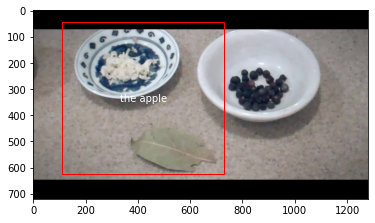

Action 2: add olive oil and onions to the pot
-------------------------------
olive oil -> Action 8 ([NULL])
the pot -> Action 8 ([NULL])


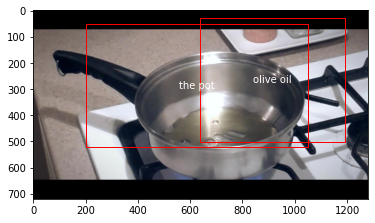

Action 3: add the apple and garlic to the pot
-------------------------------
the apple -> Action 8 ([NULL])
the pot -> Action 1 (add olive oil and onions to the pot)


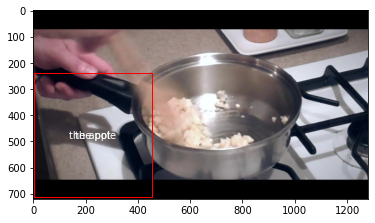

Action 4: add the sauerkraut to the pot
-------------------------------
the sauerkraut -> Action 1 (add olive oil and onions to the pot)
the pot -> Action 1 (add olive oil and onions to the pot)


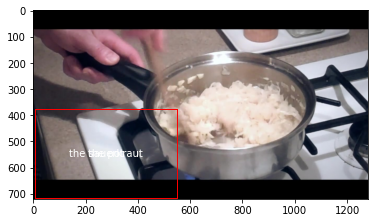

Action 5: add water juniper berries and the bay leaf to the pot
-------------------------------
water juniper berries -> Action 3 (add the sauerkraut to the pot)
the pot -> Action 3 (add the sauerkraut to the pot)


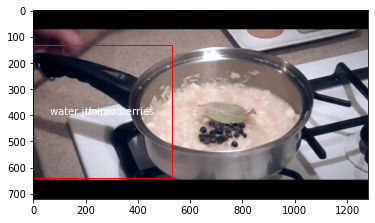

Action 6: boil the bratwursts in water
-------------------------------
the bratwursts -> Action 1 (add olive oil and onions to the pot)
water -> Action 8 ([NULL])


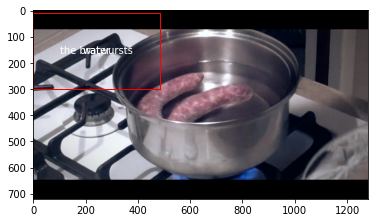

Action 7: add butter and olive oil to a skillet
-------------------------------
butter -> Action 3 (add the sauerkraut to the pot)
a skillet -> Action 1 (add olive oil and onions to the pot)


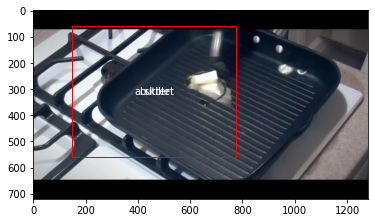

Action 8: cook the bratwursts on the skillet
-------------------------------
the bratwursts -> Action 3 (add the sauerkraut to the pot)
the skillet -> Action 3 (add the sauerkraut to the pot)


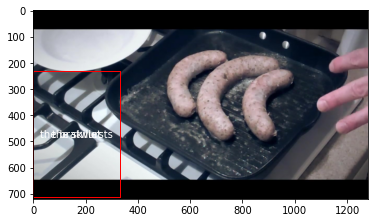

In [174]:
import visualizer
VG, RR = visualizer.inference(model, 8, 16)

In [60]:
BATCH_SIZE = 1
NUM_ACTIONS = 8+1
CANDIDATES = 20
entity_count = entity_count_list


#more inference computations
token_ids = inputs.input_ids

entity_idx = ((token_ids == '[unused2]') | (token_ids == '[unused1]'))
action_idx = (token_ids == '[unused3]')
null_idx = (token_ids == '[unused1]')

entity_embeddings = output['language_output'][entity_idx]
action_embeddings = output['language_output'][action_idx]
vision_embeddings = output['vision_output']
null_embedding = output['language_output'][null_idx]

split_sizes = torch.tensor(entity_count).flatten().tolist()
entities = entity_embeddings.split(split_sizes)

E = pad_sequence(entities, batch_first=True)
max_entities = E.shape[1]
E = E.reshape(-1, NUM_ACTIONS, E.shape[1], E.shape[2])

A = action_embeddings.reshape(BATCH_SIZE, NUM_ACTIONS, -1)
V = vision_embeddings.reshape(BATCH_SIZE, NUM_ACTIONS - 1, CANDIDATES, -1)

# Add generated null features to the outputted vision features.
null_features = 0.0*self.null(null_embedding).reshape(BATCH_SIZE, self.NUM_FRAMES_PER_STEP * self.MAX_DETECTIONS,  self.OUTPUT_EMBEDDING_SIZE)
V = torch.cat((V, null_features.unsqueeze(1)), 1)

# Calculate RR (RR_scores_index).
#note: we write c here as number of actions as well
#since we don't wish to sum over a
RR_scores = torch.einsum('baes, bcs -> baec', E, A)

edge_mask = torch.ones(NUM_ACTIONS, NUM_ACTIONS).tril(diagonal=-1).cuda()
edge_mask[-1, :] = 0
edge_mask[:, -1] = 1
edge_mask = einops.repeat(edge_mask, 'x y -> b x c y', b=BATCH_SIZE, c=max_entities)

RR_scores_max, RR_scores_index = (RR_scores * edge_mask).max(dim=-1)

# Update entities to include actions.
RR_combine = RR_scores_index.flatten(1, 2)
action_index = torch.arange(RR_combine.shape[0]).repeat_interleave(RR_combine.shape[1]).reshape(RR_combine.shape[0], -1)
A_spread = A[action_index, RR_combine].reshape(E.shape)

E = E + A_spread

# Calculate loss_E.
loss_E = E

# Calculate VG (VG_scores_index) and loss_V.
VG_scores = torch.einsum('bacs, baes -> baec', V, E)
VG_scores_max, VG_scores_index = VG_scores.max(dim=-1)

V_flat = V.reshape(-1, self.OUTPUT_EMBEDDING_SIZE)

VG_scores_index_flat = VG_scores_index.flatten()
offsets = torch.arange(0, BATCH_SIZE * NUM_ACTIONS * CANDIDATES, CANDIDATES).cuda()
offsets = offsets.repeat_interleave(max_entities)

VG_scores_index_flat = VG_scores_index_flat + offsets

loss_V = V_flat[VG_scores_index_flat, :].reshape(BATCH_SIZE, NUM_ACTIONS, max_entities, -1)

# Calculate loss_R.
loss_R = torch.ones((BATCH_SIZE, NUM_ACTIONS, NUM_ACTIONS)).cuda()

dim_1 = RR_scores_index.reshape(BATCH_SIZE, -1)
dim_2 = torch.arange(NUM_ACTIONS).repeat_interleave(max_entities)
dim_2 = einops.repeat(dim_2, 'd -> b d', b=BATCH_SIZE)

loss_R[:, dim_1, dim_2] = 0.0

RuntimeError: start (0) + length (1) exceeds dimension size (0).

In [11]:
model

Model(
  (lxmert): LxmertModel(
    (embeddings): LxmertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768, padding_idx=0)
      (token_type_embeddings): Embedding(2, 768, padding_idx=0)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): LxmertEncoder(
      (visn_fc): LxmertVisualFeatureEncoder(
        (visn_fc): Linear(in_features=2048, out_features=768, bias=True)
        (visn_layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
        (box_fc): Linear(in_features=4, out_features=768, bias=True)
        (box_layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (layer): ModuleList(
        (0): LxmertLayer(
          (attention): LxmertSelfAttentionLayer(
            (self): LxmertAttention(
              (query): Linear(in_features=

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = Model(device)

optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = get_linear_schedule_with_warmup(optimizer, int(0.2*epochs), epochs)

Epoch 1 - Train Loss: 464.7216796875, Validation Loss: 1144.1181640625
Epoch 2 - Train Loss: 464.7216796875, Validation Loss: 984.3209228515625
Epoch 3 - Train Loss: 270.23931884765625, Validation Loss: 750.2196044921875
Epoch 4 - Train Loss: 199.98428344726562, Validation Loss: 697.0597534179688
Epoch 5 - Train Loss: 202.1995849609375, Validation Loss: 591.2635498046875
Epoch 6 - Train Loss: 177.8148651123047, Validation Loss: 523.7152099609375
Epoch 7 - Train Loss: 198.1712188720703, Validation Loss: 447.53802490234375
Epoch 8 - Train Loss: 119.53001403808594, Validation Loss: 425.8950500488281
Epoch 9 - Train Loss: 213.48097229003906, Validation Loss: 413.12957763671875
Epoch 10 - Train Loss: 132.15084838867188, Validation Loss: 420.14044189453125
Epoch 11 - Train Loss: 140.01959228515625, Validation Loss: 459.53753662109375
Epoch 12 - Train Loss: 246.1787109375, Validation Loss: 470.3150329589844
Epoch 13 - Train Loss: 245.55270385742188, Validation Loss: 428.9680480957031
Epoch 14

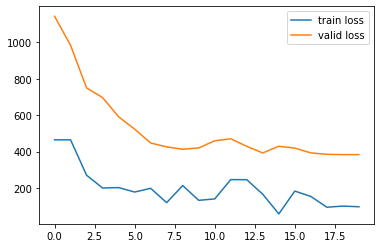

In [185]:
#model training on single datapoint
y = 1.0
epochs = 20

num_actions = 8
batch_size = 1
lr = 1e-6


train_loss = np.zeros(epochs)
valid_loss = np.zeros(epochs)

model.eval()

for epoch in range(epochs):
    epoch_loss = 0.0
    num_batches = 0
    for data in [datapoint]:
        _, bboxes_tensor, features_tensor, steps_list, _, entity_count_list, _, _ = data
        batch_size = len(data[0])

        # Zero out any gradients.
        optimizer.zero_grad()

        # Run inference (forward pass).            
        loss_E, loss_V, loss_R, _, _, _, _, _ = model(batch_size, num_actions + 1, steps_list, features_tensor, bboxes_tensor, entity_count_list)

        # Loss from alignment.
        loss_ = loss_RA_MIL(y, loss_R, loss_E, loss_V)

        # Backpropagation (backward pass).
        loss_.backward()

        # Update parameters.
        optimizer.step()

        epoch_loss += loss_
        num_batches += 1

    #learning rate schedule
    #update after each epoch
    scheduler.step()
    epoch_loss = epoch_loss / num_batches

    # Save loss and accuracy at each epoch, plot (and checkpoint).
    train_loss[epoch] = epoch_loss
    valid_loss[epoch] = get_validation_loss(num_actions, y, valid_dataloader)

    #after epoch completes
    print("Epoch {} - Train Loss: {}, Validation Loss: {}".format(epoch + 1, train_loss[epoch], valid_loss[epoch]))

plt.plot(train_loss, label='train loss')
plt.plot(valid_loss, label='valid loss')
plt.legend()
plt.show()


Action 1: peel the apple and chop it into pieces
-------------------------------
the apple -> Action 8 ([NULL])


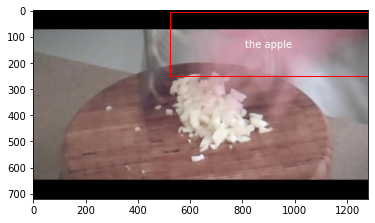

Action 2: add olive oil and onions to the pot
-------------------------------
olive oil -> Action 0 (peel the apple and chop it into pieces)
the pot -> Action 0 (peel the apple and chop it into pieces)


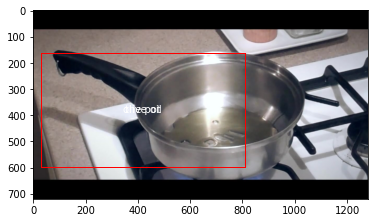

Action 3: add the apple and garlic to the pot
-------------------------------
the apple -> Action 1 (add olive oil and onions to the pot)
the pot -> Action 1 (add olive oil and onions to the pot)


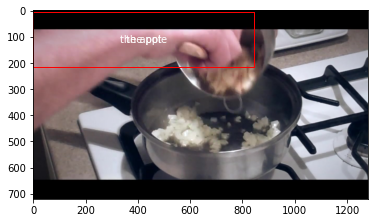

Action 4: add the sauerkraut to the pot
-------------------------------
the sauerkraut -> Action 8 ([NULL])
the pot -> Action 1 (add olive oil and onions to the pot)


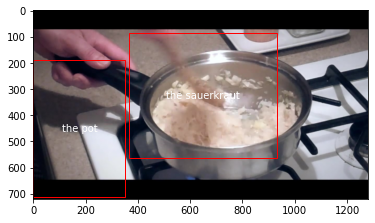

Action 5: add water juniper berries and the bay leaf to the pot
-------------------------------
water juniper berries -> Action 1 (add olive oil and onions to the pot)
the pot -> Action 1 (add olive oil and onions to the pot)


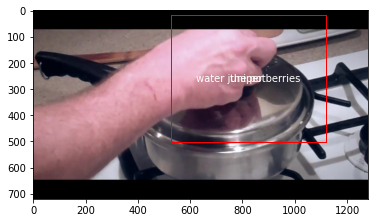

Action 6: boil the bratwursts in water
-------------------------------
the bratwursts -> Action 1 (add olive oil and onions to the pot)
water -> Action 8 ([NULL])


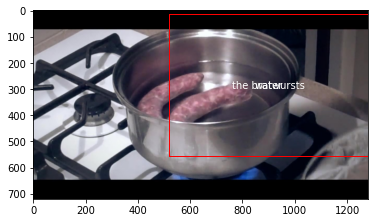

Action 7: add butter and olive oil to a skillet
-------------------------------
butter -> Action 1 (add olive oil and onions to the pot)
a skillet -> Action 1 (add olive oil and onions to the pot)


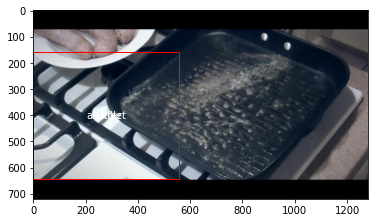

Action 8: cook the bratwursts on the skillet
-------------------------------
the bratwursts -> Action 1 (add olive oil and onions to the pot)
the skillet -> Action 1 (add olive oil and onions to the pot)


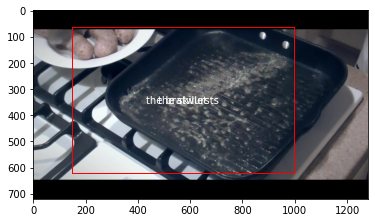

In [186]:
VG, RR = visualizer.inference(model, 8, 16)

In [187]:
#inference on the above datapoint
features = features_tensor.to(model.device)
boxes = bboxes_tensor.to(model.device)

inputs = model.lxmert_tokenizer(
    steps_list,
    padding="longest",
    truncation=False,
    return_token_type_ids=True,
    return_attention_mask=True,
    add_special_tokens=True,
    return_tensors="pt"
)

inputs.input_ids = inputs.input_ids.to(model.device)
inputs.attention_mask = inputs.attention_mask.to(model.device)
inputs.token_type_ids = inputs.token_type_ids.to(model.device)

output = model.lxmert(
    input_ids=inputs.input_ids,
    attention_mask=inputs.attention_mask,
    visual_feats=features,
    visual_pos=boxes,
    token_type_ids=inputs.token_type_ids,
    return_dict=True,
    output_attentions=True
)


In [188]:
lang_out = output['language_output']
vis_out = output['vision_output']

#from above we know index 4 corresponds to token 'apple', 
#on the other hand, index 2 should encode 'the apple' entity
# and index 13 is for another entity 'olive oil'
apple_l_embed = lang_out[0,4,:]
apple_entity_l_embed = lang_out[0,2,:]

In [212]:
cos_sim_after_train_apple_ent = get_similarity_list(lang_out[0], apple_entity_l_embed)
get_most_similar_text(2, cos_sim_after_train_apple_ent)

Index with max similarity to query is:  tensor(44)


['[unused2]']

In [217]:
cos_sim_after_train_apple_v = get_similarity_list(vis_out[0], apple_l_embed)
torch.argmax(cos_sim_after_train_apple_v)

tensor(369)

In [216]:
cos_sim_after_train_apple_ent_v = get_similarity_list(vis_out[0], apple_entity_l_embed)
torch.argmax(cos_sim_after_train_apple_ent_v)

tensor(666)

In [196]:
cos_sim_after_train_apple_ent

tensor([0.8043, 0.7523, 0.0000, 0.7791, 0.7025, 0.7623, 0.6767, 0.7876, 0.6798,
        0.6491, 0.6302, 0.8223, 0.6498, 0.8007, 0.5824, 0.6054, 0.6440, 0.5118,
        0.6930, 0.8152, 0.6630, 0.6907, 0.7093, 0.8682, 0.7249, 0.8838, 0.5487,
        0.7559, 0.7812, 0.6860, 0.7846, 0.8645, 0.5450, 0.6761, 0.6967, 0.8546,
        0.7132, 0.8758, 0.5816, 0.6882, 0.7615, 0.8307, 0.7023, 0.7974, 0.8848,
        0.5537, 0.6785, 0.6933, 0.8580, 0.7249, 0.8698, 0.7711, 0.8769, 0.7601,
        0.7873, 0.8788, 0.5727, 0.7531, 0.7327, 0.7815, 0.6411, 0.6545, 0.6788,
        0.8518, 0.7816, 0.8536, 0.6111, 0.8193, 0.7899, 0.7694, 0.7435, 0.7857,
        0.8825, 0.7809, 0.6954, 0.8639, 0.7441, 0.8706, 0.6261, 0.7771, 0.7536,
        0.7325, 0.7828, 0.8711, 0.6728, 0.7537, 0.7335, 0.6896, 0.8658, 0.7723,
        0.8773, 0.5943, 0.7609, 0.8196, 0.7480, 0.7530, 0.7335, 0.8705, 0.5663,
        0.7632, 0.7619, 0.6932, 0.8501, 0.8779, 0.8517, 0.4974],
       grad_fn=<CopySlices>)

In [199]:
cos_sim_after_train_apple_ent[23]

tensor(0.8682, grad_fn=<SelectBackward>)

In [209]:
#sorted list of which tokens apple entity has max similarity with
inds = torch.argsort(cos_sim_after_train_apple_ent, descending=True)
for i in inds:
    #print(i)
    print(get_corresponding_token(inputs, i))

['[unused2]']
['[unused2]']
['[unused2]']
['[unused2]']
['[unused1]']
['[unused2]']
['juniper']
['[unused2]']
['[unused2]']
['[unused2]']
['[unused2]']
['[unused2]']
['[unused3]']
['[unused3]']
['[unused2]']
['[unused3]']
['[unused3]']
['[unused3]']
['[unused2]']
['[unused3]']
['[unused3]']
['[unused3]']
['##kra']
['[unused3]']
['##wu']
['brat']
['[unused2]']
['[CLS]']
['[unused2]']
['to']
['##wu']
['it']
['and']
['in']
['to']
['to']
['boil']
['to']
['and']
['water']
['the']
['and']
['cook']
['water']
['##rst']
['skill']
['and']
['##et']
['##uer']
['brat']
['berries']
['apple']
['skill']
['olive']
['bay']
['##s']
['peel']
['##rst']
['add']
['##s']
['##et']
['on']
['leaf']
['oil']
['add']
['add']
['add']
['.']
['apple']
['##ut']
['.']
['.']
['.']
['.']
['to']
['pot']
['.']
['sa']
['garlic']
['into']
['.']
['pot']
['chop']
['pot']
['a']
['the']
['pot']
['add']
['pieces']
['and']
['the']
['.']
['butter']
['the']
['oil']
['the']
['olive']
['the']
['the']
['the']
['the']
['the']
['the']
['o

In [192]:
torch.argmax(cos_sim_after_train_apple_ent)

tensor(2)